#Install Dependencies

_(Remember to choose GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)_

In [1]:
!nvidia-smi

Wed Jan 29 04:19:46 2025       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   54C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

# Your Custom Data

In [2]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="1VXsLEMewd5RO1aVFfBb")
project = rf.workspace("firstworkflow-tn92r").project("sign_lag_v8")
version = project.version(2)
dataset = version.download("yolov8")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.5/81.5 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 11.5 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Sign_Lag_V8-2 in yolov8:: 100%|██████████| 3804/3804 [00:00<00:00, 4497.03it/s]


# Setup

Pip install `ultralytics` and [dependencies](https://github.com/ultralytics/ultralytics/blob/main/pyproject.toml) and check software and hardware.

[![PyPI - Version](https://img.shields.io/pypi/v/ultralytics?logo=pypi&logoColor=white)](https://pypi.org/project/ultralytics/) [![Downloads](https://static.pepy.tech/badge/ultralytics)](https://www.pepy.tech/projects/ultralytics) [![PyPI - Python Version](https://img.shields.io/pypi/pyversions/ultralytics?logo=python&logoColor=gold)](https://pypi.org/project/ultralytics/)

In [3]:
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.69 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 31.5/112.6 GB disk)


In [4]:
from ultralytics import YOLO
import os

from IPython.display import display, Image
from IPython import display

# Clear previous outputs
display.clear_output()

# Run YOLO checks
!yolo checks


Ultralytics 8.3.69 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 31.5/112.6 GB disk)

OS                  Linux-6.1.85+-x86_64-with-glibc2.35
Environment         Colab
Python              3.11.11
Install             pip
RAM                 12.67 GB
Disk                31.5/112.6 GB
CPU                 Intel Xeon 2.00GHz
CPU count           2
GPU                 Tesla T4, 15102MiB
GPU count           1
CUDA                12.1

numpy               ✅ 1.26.4>=1.23.0
numpy               ✅ 1.26.4<2.0.0; sys_platform == "darwin"
matplotlib          ✅ 3.10.0>=3.3.0
opencv-python       ✅ 4.10.0.84>=4.6.0
pillow              ✅ 11.1.0>=7.1.2
pyyaml              ✅ 6.0.2>=5.3.1
requests            ✅ 2.32.3>=2.23.0
scipy               ✅ 1.13.1>=1.4.1
torch               ✅ 2.5.1+cu121>=1.8.0
torch               ✅ 2.5.1+cu121!=2.4.0,>=1.8.0; sys_platform == "win32"
torchvision         ✅ 0.20.1+cu121>=0.9.0
tqdm                ✅ 4.67.1>=4.64.0
ps

# Train Custom YOLOv8 Detector

### Next, we'll fire off training!


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [6]:
!yolo task=detect mode=train model=yolov8m.pt data={dataset.location}/data.yaml epochs=5 imgsz=640

 #! yolo task=detect mode=train model=yolov8m.pt data={dataset.location}/data.yaml epochs=200 imgsz=640 batch=16


Ultralytics 8.3.69 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/Sign_Lag_V8-2/data.yaml, epochs=5, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_

# Evaluate Custom YOLOv8 Detector Performance

In [8]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

### Curious? Visualize Our Training Data with Labels


GROUND TRUTH TRAINING DATA:


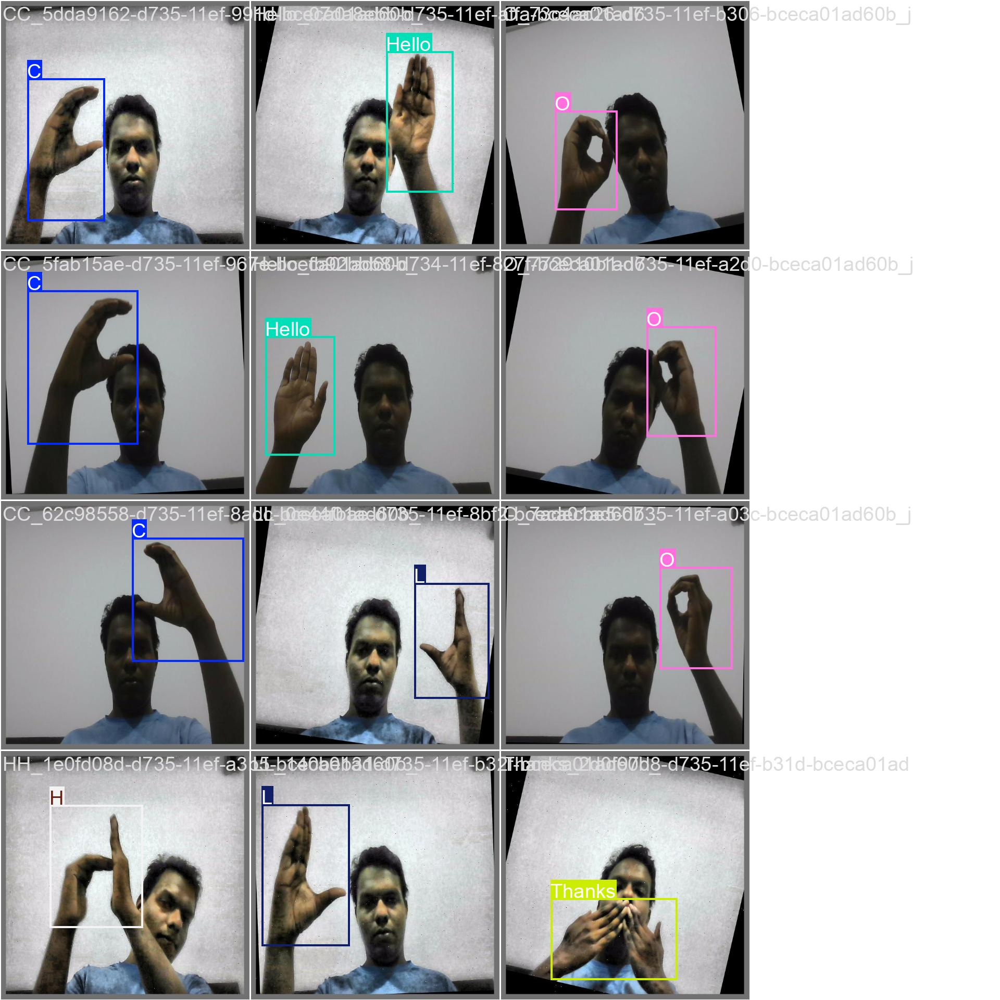

In [11]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/runs/detect/train/val_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


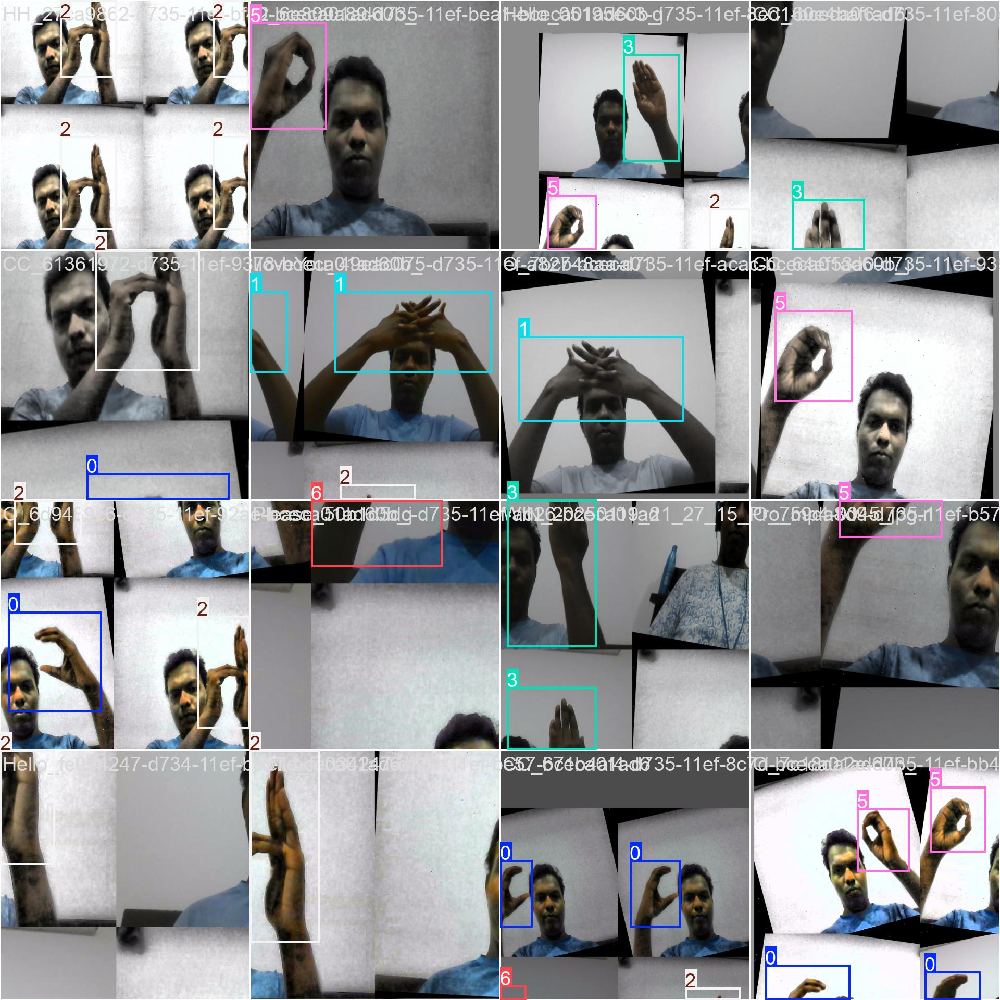

In [12]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/runs/detect/train/train_batch0.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


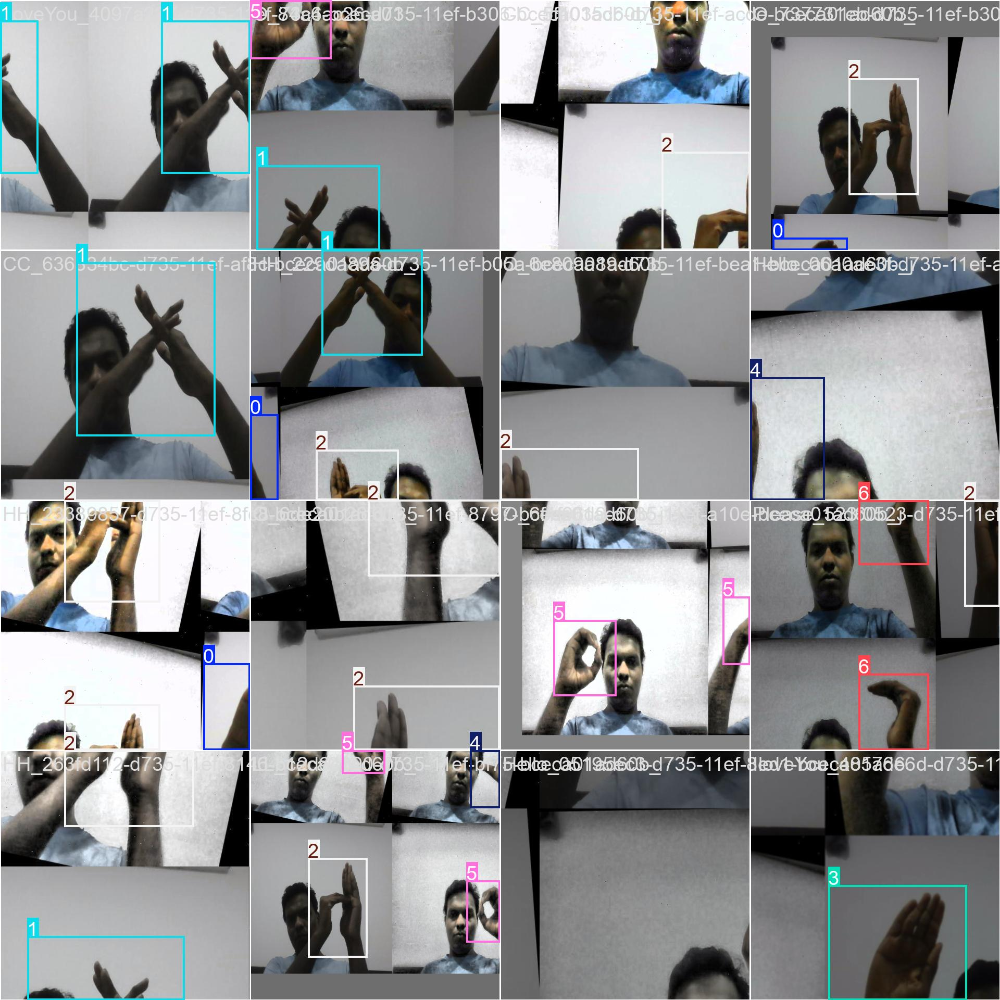

In [13]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/runs/detect/train/train_batch1.jpg', width=900)

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

## **Validation**


In [14]:
!yolo task=detect mode=val model=/content/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

Ultralytics 8.3.69 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25,844,392 parameters, 0 gradients, 78.7 GFLOPs
val: Scanning /content/Sign_Lag_V8-2/valid/labels.cache... 12 images, 0 backgrounds, 0 corrupt: 100% 12/12 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 1/1 [00:01<00:00,  1.40s/it]
                   all         12         12      0.897      0.996      0.995      0.699
                     C          3          3      0.953          1      0.995      0.402
                     H          1          1      0.845          1      0.995      0.796
                 Hello          2          2          1      0.974      0.995      0.702
                     L          2          2      0.877          1      0.995      0.796
                     O          3          3      0.922          1      0.995      0.703
                Thanks          1          1      0.7

## **Detect**


In [16]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True

Ultralytics 8.3.69 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25,844,392 parameters, 0 gradients, 78.7 GFLOPs

image 1/109 /content/Sign_Lag_V8-2/test/images/CC_5d8d057a-d735-11ef-94ab-bceca01ad60b_jpg.rf.084732ffa59d06fca67b922b37067208.jpg: 640x640 1 C, 37.0ms
image 2/109 /content/Sign_Lag_V8-2/test/images/CC_5f5d9498-d735-11ef-8fcc-bceca01ad60b_jpg.rf.ce4fafe5e33bb5fd6164af0771c5f36a.jpg: 640x640 1 C, 37.1ms
image 3/109 /content/Sign_Lag_V8-2/test/images/CC_60e4baf6-d735-11ef-80ce-bceca01ad60b_jpg.rf.317b17cb3d84ffcb2aaa39d725af83fa.jpg: 640x640 1 C, 37.0ms
image 4/109 /content/Sign_Lag_V8-2/test/images/CC_61d5494e-d735-11ef-981d-bceca01ad60b_jpg.rf.29bd06a3e7e55aba6f34ee1e1340f619.jpg: 640x640 1 C, 36.9ms
image 5/109 /content/Sign_Lag_V8-2/test/images/CC_627838d9-d735-11ef-8aa8-bceca01ad60b_jpg.rf.117aef5c86d8960ce8b37d96e4c977f9.jpg: 640x640 1 C, 30.3ms
image 6/109 /content/Sign_Lag_V8-2/test/images/CC_64073e7c-d735-11ef-af55-

### **Curious About  Prediction Made ? **
# **Let's See Few Samples**

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg'):
    display(Image(filename=image_path, height=600))
    print("\n")

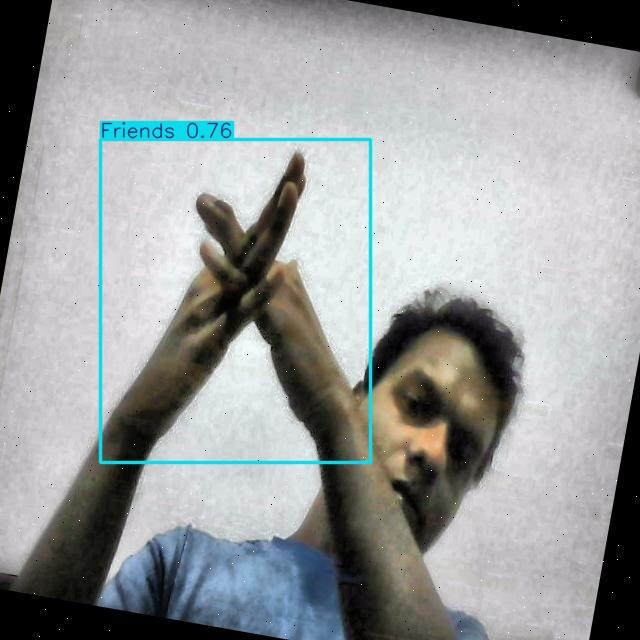

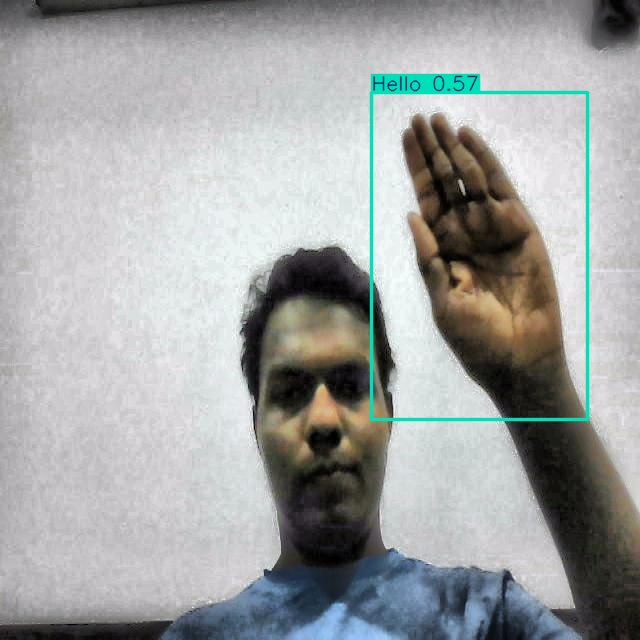

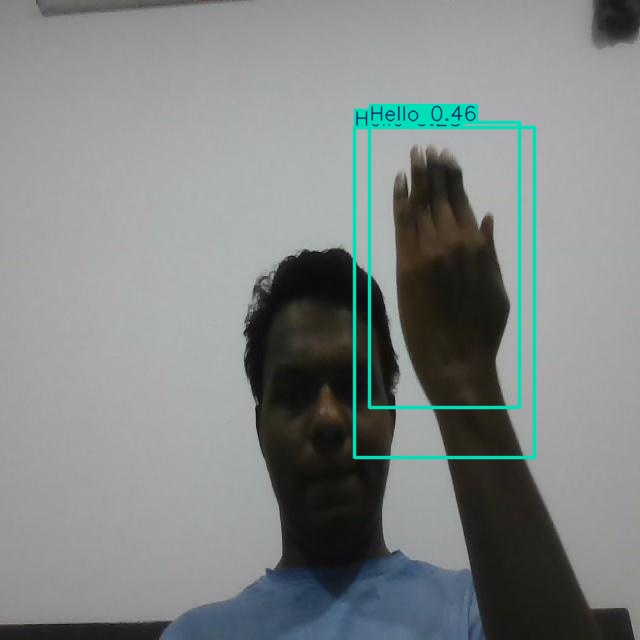

In [18]:
import glob
from IPython.display import Image, display

# Define the base path where the folders are located
base_path = '/content/runs/detect/'

# List all directories that start with 'predict' in the base path
subfolders = [os.path.join(base_path, d) for d in os.listdir(base_path)
              if os.path.isdir(os.path.join(base_path, d)) and d.startswith('predict')]

# Find the latest folder by modification time
latest_folder = max(subfolders, key=os.path.getmtime)

image_paths = glob.glob(f'{latest_folder}/*.jpg')[:3]

# Display each image
for image_path in image_paths:
    display(Image(filename=image_path, width=600))
    print("\n")

# **Congratulation 🎉!**
You made it so far your Model is Ready to Deploy !

**Note :**



1.   Make Sure Your DataSet Version Should not have existing pretrained Model. If Applicable then Delete that datasetversion and create new one
2.  **Would you like to continue with the wrong version of ultralytics? y/n: **y****

3. If getting version issue for data set try modifing 'data.version' manually.



In [ ]:
project.version(dataset.version).deploy(model_type="yolov8m", model_path=f"/content/runs/detect/train2")

Dependency ultralytics==8.0.196 is required but found version=8.3.68, to fix: `pip install ultralytics==8.0.196`
Would you like to continue with the wrong version of ultralytics? y/n: y
View the status of your deployment at: https://app.roboflow.com/firstworkflow-tn92r/sign_lag_v8/2
Share your model with the world at: https://universe.roboflow.com/firstworkflow-tn92r/sign_lag_v8/model/2


In [7]:
%cd '/content/'

/content


# **IF You Want to Save Your Progress to your Local Machine -->**

In [ ]:
import shutil
from google.colab import files

# Path to the folder you want to zip (entire /content folder)
folder_to_zip = "/content"

# Output zip file path (without the .zip extension)
output_zip_file = "/content/content"

# Create a zip file of the entire /content folder
shutil.make_archive(output_zip_file, 'zip', folder_to_zip)

# Download the zip file
files.download(output_zip_file + ".zip")


RuntimeError: File size too large, try using force_zip64